<a href="https://colab.research.google.com/github/vikas-singh16/Topic-Modelling-Using-LDA/blob/main/LDA.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!pip install openpyxl

In [ ]:
!pip install bokeh

In [ ]:
!pip install octis

     |████████████████████████████████| 129 kB 4.2 MB/s 
     |████████████████████████████████| 16.3 MB 15.4 MB/s 
     |████████████████████████████████| 170 kB 73.5 MB/s 
     |████████████████████████████████| 100 kB 12.0 MB/s 
     |████████████████████████████████| 22.3 MB 92.9 MB/s 
     |████████████████████████████████| 79 kB 11.1 MB/s 
     |████████████████████████████████| 24.1 MB 1.3 MB/s 
     |████████████████████████████████| 3.8 MB 26.6 MB/s 
     |████████████████████████████████| 1.2 MB 24.9 MB/s 
     |████████████████████████████████| 67 kB 7.5 MB/s 
     |████████████████████████████████| 596 kB 71.6 MB/s 
     |████████████████████████████████| 895 kB 55.7 MB/s 
     |████████████████████████████████| 6.5 MB 54.4 MB/s 
  Created wheel for libsvm: filename=libsvm-3.23.0.4-cp37-cp37m-linux_x86_64.whl size=233362 sha256=23358635731912892d466c3bd33717f0ac96db0179d68d97fb0655ae5ecc9c89
  Stored in directory: /root/.cache/pip/wheels/cd/e8/1e/bf95cf256e4d3ffc94289ab508c

In [ ]:
!pip install preprocessor

  Created wheel for preprocessor: filename=preprocessor-1.1.3-py3-none-any.whl size=4477 sha256=458ffd051895faf544137a1b799a588c38f4f75294fca8aa9af7cb3139387234
  Stored in directory: /root/.cache/pip/wheels/0e/b7/36/aa37256db62b4bfd35a6f1b5536e9ba843f257b79dcbf3d5f1
Successfully built preprocessor


In [ ]:
import pandas as pd
import os
import numpy as np

In [ ]:
import en_core_web_sm

In [ ]:
import numpy as np
from sklearn.decomposition import NMF
from sklearn.feature_extraction.text import TfidfVectorizer
from octis.evaluation_metrics.diversity_metrics import TopicDiversity
from octis.evaluation_metrics.coherence_metrics import Coherence
import spacy
# import en_core_web_sm
from spacy.lang.en.stop_words import STOP_WORDS
import preprocessor as tweet_processor

In [ ]:
cd /content/drive/MyDrive/Topic Modelling with LDA

/content/drive/MyDrive/Topic Modelling with LDA


In [ ]:
data = pd.read_excel("/content/drive/MyDrive/Topic Modelling with LDA/Policy  Ethics.xlsx",keep_default_na= False)

In [ ]:
data

,articleText,title
0,The first charge of a state governor should be...,Andrew Cuomo Should Resign
1,Editor’s Note (3/3/21): The shocking recent bl...,Green Alternative to Border Wall Might Have Sa...
2,The long-anticipated CDC guidance on schools w...,Science and Society Are Failing Children in th...
3,Like many low-wage restaurant workers in Bosto...,It’s a Myth That Asian-Americans Are Doing Wel...
4,When Joe Biden was sworn in as the 46th U.S. p...,Biden Must Take Immediate Action to Reduce the...
...,...,...
14891,\r\nThe image was created by Michael F. Summer...,Cracking Open AIDS's Shell
14892,During the judicial hearings that culminated ...,Turf Wars in Cyberspace
14893,\r\nOne of the great drawbacks of placing a pr...,Electric Collections
14894,"Across the nation, insomniacs, the sick and th...",Melatonin Mania


In [ ]:
articleText = data["articleText"].tolist()
# articleText[13499]

In [ ]:
def removing_nan_article(data):    
    for idx in data:
       if idx == "":
        data.remove(idx)
    return data

In [ ]:
corrected_data = removing_nan_article(articleText)

In [ ]:
len(corrected_data)

13437

In [ ]:
import spacy
import en_core_web_sm
from spacy.lang.en.stop_words import STOP_WORDS

In [ ]:
spacy_nlp = spacy.load("en_core_web_sm", disable=["tok2vec", "tagger", "parser", "attribute_ruler"])

In [ ]:
spacy_nlp.Defaults.stop_words |= {'phone', 'good','great','nice', '\r','\n','$' ,'like', 'come','take' ,'make','give','thing','want','show','tell',
                                 'set', 'get', 'see','past', 'clear','word',"let" ,'part' ,'e' ,'sure' ,'April' ,'option' ,'January','the','July',
                                 'date' ,'put', 'December' , 'October', 'will' , 'dozen', 'cite', 'page', 'August' }

In [ ]:
def tokenizer(article):
    processed_article = []
    spacy_article = spacy_nlp(article)
    for text in spacy_article:
        if not text.is_stop and not text.is_punct and not text.like_num and text.is_alpha:
            processed_article += text.lemma_.split()
    return processed_article

In [ ]:
tokenizer(corrected_data[1])

['Editor',
 'Note',
 'shock',
 'recent',
 'blackout',
 'Texas',
 'leave',
 'million',
 'people',
 'electricity',
 'clean',
 'water',
 'cause',
 'dozen',
 'death',
 'inflict',
 'economic',
 'damage',
 'estimate',
 'ten',
 'billion',
 'dollar',
 'Blame',
 'grid',
 'failure',
 'widely',
 'fall',
 'Electric',
 'Reliability',
 'Council',
 'Texas',
 'state',
 'long',
 'stand',
 'practice',
 'structure',
 'power',
 'system',
 'island',
 'connect',
 'rest',
 'country',
 'climate',
 'change',
 'future',
 'extreme',
 'weather',
 'likely',
 'year',
 'ago',
 'diverse',
 'group',
 'engineer',
 'scientist',
 'propose',
 'radical',
 'alternative',
 'border',
 'wall',
 'place',
 'supply',
 'Texas',
 'need',
 'electricity',
 'clean',
 'drink',
 'water',
 'proponent',
 'article',
 'publish',
 'time',
 'present',
 'compel',
 'plan',
 'turn',
 'border',
 'corridor',
 'renewable',
 'energy',
 'freshwater',
 'serve',
 'state',
 'country',
 'provide',
 'secure',
 'border',
 'job',
 'idea',
 'Instead',
 'endl

In [ ]:
article = corrected_data[1]

In [ ]:
from concurrent.futures import ThreadPoolExecutor

In [ ]:
processed_article = []
with ThreadPoolExecutor(max_workers=4) as exec:
    processed_article = list(exec.map(tokenizer,corrected_data))
processed_article

[['charge',
  'state',
  'governor',
  'constituent',
  'alive',
  'possible',
  'especially',
  'time',
  'crisis',
  'collusion',
  'fawn',
  'news',
  'medium',
  'include',
  'brother',
  'CNN',
  'anchor',
  'Chris',
  'Cuomo',
  'Governor',
  'Andrew',
  'Cuomo',
  'New',
  'York',
  'fail',
  'COVID',
  'pandemic',
  'prove',
  'respect',
  'understand',
  'scientific',
  'knowledge',
  'avoid',
  'needlessly',
  'let',
  'thousand',
  'New',
  'Yorkers',
  'die',
  'resign',
  'immediately',
  'strange',
  'sycophant',
  'press',
  'nickname',
  'Cuomo',
  'America',
  'governor',
  'year',
  'press',
  'dub',
  'Rudy',
  'Giuliani',
  'America',
  'mayor',
  'try',
  'subvert',
  'election',
  'law',
  'look',
  'hagiography',
  'hold',
  'time',
  'March',
  'toll',
  'COVID',
  'Wuhan',
  'China',
  'Lombardi',
  'Italy',
  'know',
  'New',
  'York',
  'City',
  'Mayor',
  'Bill',
  'de',
  'Blasio',
  'want',
  'shelter',
  'place',
  'order',
  'hour',
  'Cuomo',
  'dismis

In [ ]:
_ = processed_article[1]
" ".join(_)

'Editor Note shock recent blackout Texas leave million people electricity clean water cause dozen death inflict economic damage estimate ten billion dollar Blame grid failure widely fall Electric Reliability Council Texas state long stand practice structure power system island connect rest country climate change future extreme weather likely year ago diverse group engineer scientist propose radical alternative border wall place supply Texas need electricity clean drink water proponent article publish time present compel plan turn border corridor renewable energy freshwater serve state country provide secure border job idea Instead endless inert wall border line boundary mile natural gas solar wind power plant Use energy desalinate water Gulf Mexico Pacific Ocean ship pipeline thirsty town business new farm entire border zone Hire hundred thousand people country build run Companies money provide security safeguard asset contentious costly land transform corridor opportunity Crazy Maybe 

In [ ]:
txt_file = open("Tokenizes_txt_file.txt",'w',encoding="UTF-8")
for txt in processed_article:
    article = " ".join(txt)
    txt_file.write(article + "\n")
txt_file.close()

In [ ]:
from gensim.corpora import Dictionary

In [ ]:
dct = Dictionary(processed_article)

In [ ]:
bag_of_words_representation = [dct.doc2bow(text) for text in processed_article]

In [ ]:
list(dct.most_common(n=1000))

[('say', 60226),
 ('year', 30103),
 ('people', 20723),
 ('change', 19010),
 ('new', 18735),
 ('study', 18644),
 ('time', 17656),
 ('climate', 16989),
 ('work', 16763),
 ('find', 15272),
 ('research', 15011),
 ('percent', 14485),
 ('science', 14464),
 ('need', 13310),
 ('water', 13044),
 ('scientist', 13040),
 ('report', 12760),
 ('use', 12405),
 ('way', 12403),
 ('know', 12399),
 ('University', 12372),
 ('include', 12223),
 ('energy', 12167),
 ('high', 12157),
 ('human', 11457),
 ('think', 11413),
 ('country', 11244),
 ('world', 11228),
 ('state', 11085),
 ('long', 10753),
 ('system', 10531),
 ('researcher', 10527),
 ('health', 10482),
 ('help', 10277),
 ('company', 10157),
 ('well', 9813),
 ('datum', 9756),
 ('go', 9745),
 ('power', 9638),
 ('American', 9486),
 ('cell', 9468),
 ('level', 9344),
 ('group', 9181),
 ('lead', 9096),
 ('government', 9039),
 ('gas', 9030),
 ('large', 9026),
 ('plant', 8940),
 ('increase', 8703),
 ('public', 8441),
 ('result', 8328),
 ('problem', 8284),
 ('t

In [ ]:
import gensim

num_topics = 32
ldamodel = gensim.models.ldamodel.LdaModel(bag_of_words_representation, num_topics = num_topics, id2word=dct)

In [ ]:
!pip install pyLDAvis

     |████████████████████████████████| 1.7 MB 3.9 MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Installing backend dependencies ... done
    Preparing wheel metadata ... done
  Created wheel for pyLDAvis: filename=pyLDAvis-3.3.1-py2.py3-none-any.whl size=136898 sha256=ee831d2322983f59c99fe2a8ce44897c2dc65325006dfeda2d69140661f090f2
  Stored in directory: /root/.cache/pip/wheels/c9/21/f6/17bcf2667e8a68532ba2fbf6d5c72fdf4c7f7d9abfa4852d2f
Successfully built pyLDAvis


In [ ]:
import pyLDAvis

/usr/local/lib/python3.7/dist-packages/past/types/oldstr.py:5: DeprecationWarning: Using or importing the ABCs from 'collections' instead of from 'collections.abc' is deprecated since Python 3.3,and in 3.9 it will stop working
  from collections import Iterable
/usr/local/lib/python3.7/dist-packages/past/builtins/misc.py:4: DeprecationWarning: Using or importing the ABCs from 'collections' instead of from 'collections.abc' is deprecated since Python 3.3,and in 3.9 it will stop working
  from collections import Mapping


In [ ]:
pyLDAvis.enable_notebook()

In [ ]:
from pyLDAvis import gensim_models

In [ ]:
vis = gensim_models.prepare(ldamodel,corpus=bag_of_words_representation, dictionary=dct)

/usr/local/lib/python3.7/dist-packages/pyLDAvis/_prepare.py:247: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  by='saliency', ascending=False).head(R).drop('saliency', 1)


In [ ]:
vis

PreparedData(topic_coordinates=              x         y  topics  cluster      Freq
topic                                               
0      0.024805 -0.111037       1        1  9.133664
24     0.060358  0.091389       2        1  8.987544
16     0.002974 -0.076585       3        1  6.159113
6      0.125430  0.101499       4        1  5.929569
26     0.006144 -0.066401       5        1  5.884228
7      0.051161 -0.021249       6        1  5.827215
12     0.092599 -0.005697       7        1  5.576131
27     0.098540  0.057887       8        1  4.945672
5      0.104025  0.080093       9        1  4.929717
29     0.079663  0.079912      10        1  4.708557
22     0.059699 -0.158823      11        1  4.250389
2      0.009705 -0.047574      12        1  3.626370
4      0.023761 -0.077131      13        1  3.614603
1      0.057029  0.089329      14        1  3.159723
31    -0.022266 -0.166272      15        1  2.663530
3      0.059790  0.007655      16        1  2.659923
18     0.020675 -0.059885      17        1  2.452390
19     0.041407  0.014999      18        1  2.420736
28     0.043252  0.050371      19        1  2.400185
17     0.024247 -0.011222      20        1  2.285968
14    -0.004037 -0.091185      21        1  1.911077
23    -0.052010 -0.043666      22        1  1.657795
15     0.014595  0.067962      23        1  1.136881
25    -0.045570  0.052865      24        1  0.765148
11     0.024205  0.057540      25        1  0.740169
13    -0.011031 -0.023171      26        1  0.725969
10    -0.138489 -0.031438      27        1  0.484587
20    -0.103731 -0.004871      28        1  0.462470
9     -0.138080  0.060739      29        1  0.243664
8     -0.110354  0.054930      30        1  0.168412
30    -0.199517  0.032457      31        1  0.047903
21    -0.198980  0.096579      32        1  0.040696, topic_info=             Term          Freq         Total Category  logprob  loglift
2649         cell  14793.000000  14793.000000  Default  30.0000  30.0000
165         datum   9294.000000   9294.000000  Default  29.0000  29.0000
397           say  55344.000000  55344.000000  Default  28.0000  28.0000
458         water  14029.000000  14029.000000  Default  27.0000  27.0000
1780  information   6512.000000   6512.000000  Default  26.0000  26.0000
...           ...           ...           ...      ...      ...      ...
139       climate      4.738086  14030.859178  Topic32  -6.1937  -0.1866
418         state      4.257038   9997.654051  Topic32  -6.3007   0.0453
6111     endanger      3.151919   1140.278114  Topic32  -6.6013   1.9158
134        change      3.514626  18357.592367  Topic32  -6.4924  -0.7541
1894       United      3.297264   4002.808982  Topic32  -6.5562   0.7051

[2576 rows x 6 columns], token_table=       Topic      Freq    Term
term                          
24265     18  0.235632     AAS
7765       1  0.043521     ACA
7765       2  0.348170     ACA
7765       4  0.021761     ACA
7765       5  0.043521     ACA
...      ...       ...     ...
13671     11  0.007574     zoo
13671     14  0.003787     zoo
13671     15  0.053019     zoo
13671     24  0.018935     zoo
33853     11  0.917203  zygote

[23695 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[1, 25, 17, 7, 27, 8, 13, 28, 6, 30, 23, 3, 5, 2, 32, 4, 19, 20, 29, 18, 15, 24, 16, 26, 12, 14, 11, 21, 10, 9, 31, 22])

In [ ]:
topic_words_freq = ldamodel.show_topic(1, topn=32)
print(topic_words_freq)
dict(topic_words_freq)

[('water', 0.027731251), ('say', 0.015695708), ('state', 0.0078177415), ('EPA', 0.0072657694), ('waste', 0.0062415446), ('use', 0.0057938234), ('company', 0.005606562), ('agency', 0.0047800946), ('federal', 0.0044904356), ('year', 0.004408719), ('Water', 0.0042859376), ('city', 0.004187001), ('drink', 0.0041300147), ('plant', 0.004050039), ('environmental', 0.0038187855), ('industry', 0.0037640736), ('system', 0.0036935192), ('rule', 0.003628586), ('site', 0.003557847), ('Environmental', 0.0034097196), ('new', 0.0033693234), ('facility', 0.0031768726), ('Act', 0.00311505), ('chlorine', 0.0030429543), ('supply', 0.0030006086), ('include', 0.0029503787), ('public', 0.0029357183), ('well', 0.002927599), ('government', 0.0028728698), ('case', 0.0028489006), ('report', 0.0027189457), ('test', 0.0026932734)]


{'Act': 0.00311505,
 'EPA': 0.0072657694,
 'Environmental': 0.0034097196,
 'Water': 0.0042859376,
 'agency': 0.0047800946,
 'case': 0.0028489006,
 'chlorine': 0.0030429543,
 'city': 0.004187001,
 'company': 0.005606562,
 'drink': 0.0041300147,
 'environmental': 0.0038187855,
 'facility': 0.0031768726,
 'federal': 0.0044904356,
 'government': 0.0028728698,
 'include': 0.0029503787,
 'industry': 0.0037640736,
 'new': 0.0033693234,
 'plant': 0.004050039,
 'public': 0.0029357183,
 'report': 0.0027189457,
 'rule': 0.003628586,
 'say': 0.015695708,
 'site': 0.003557847,
 'state': 0.0078177415,
 'supply': 0.0030006086,
 'system': 0.0036935192,
 'test': 0.0026932734,
 'use': 0.0057938234,
 'waste': 0.0062415446,
 'water': 0.027731251,
 'well': 0.002927599,
 'year': 0.004408719}

In [ ]:
!pip install wordcloud

Topic  1


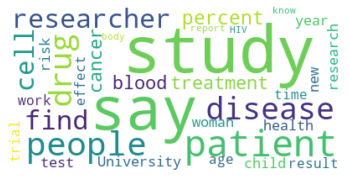

Topic  2


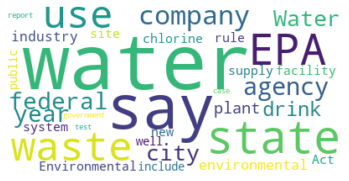

Topic  3


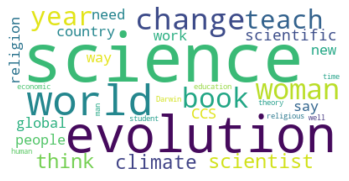

Topic  4


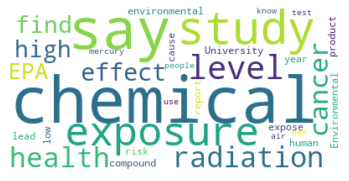

Topic  5


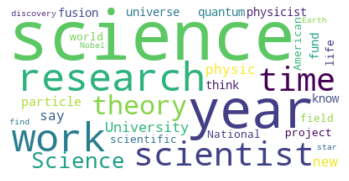

Topic  6


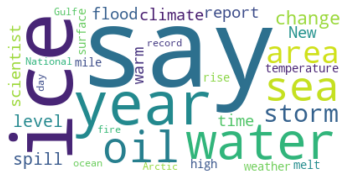

Topic  7


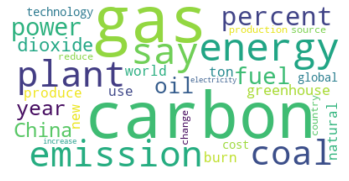

Topic  8


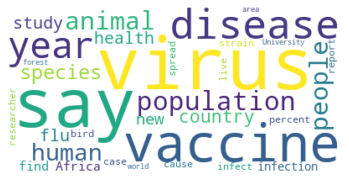

Topic  9


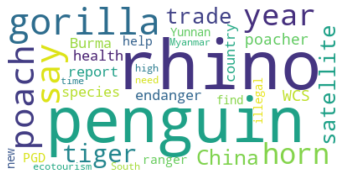

Topic  10


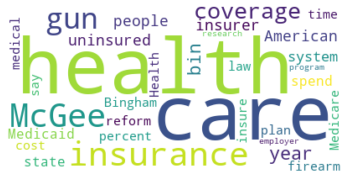

Topic  11


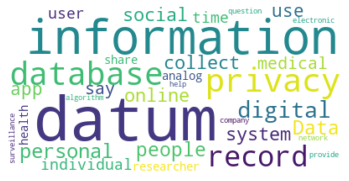

Topic  12


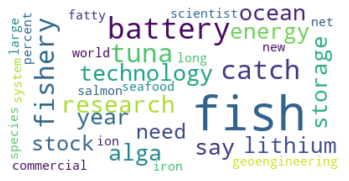

Topic  13


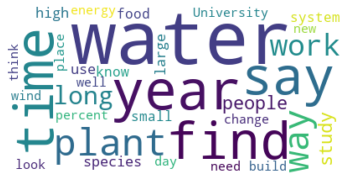

Topic  14


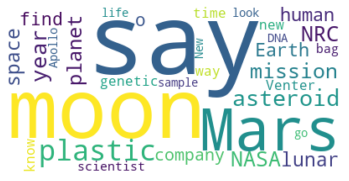

Topic  15


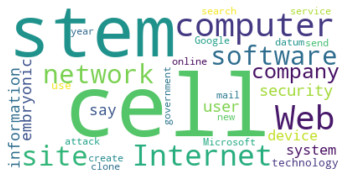

Topic  16


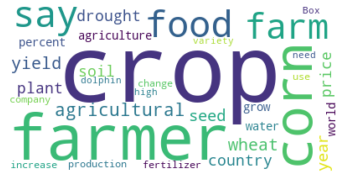

Topic  17


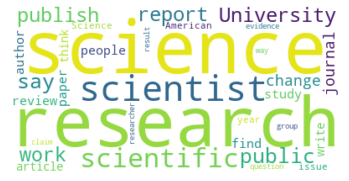

Topic  18


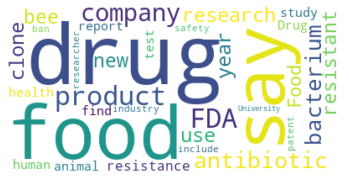

Topic  19


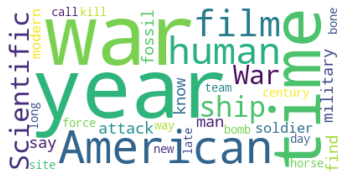

Topic  20


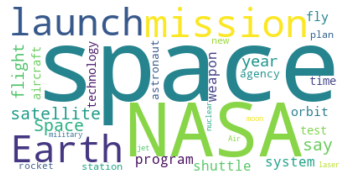

Topic  21


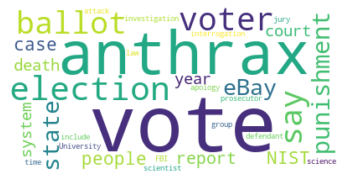

Topic  22


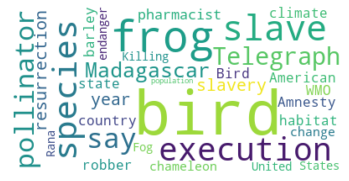

Topic  23


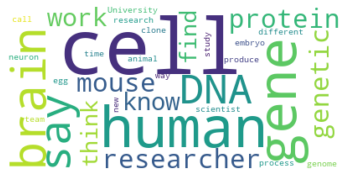

Topic  24


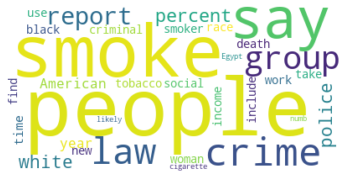

Topic  25


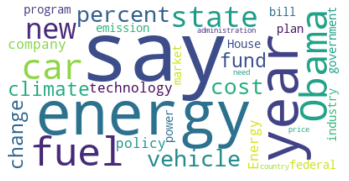

Topic  26


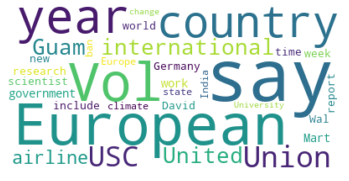

Topic  27


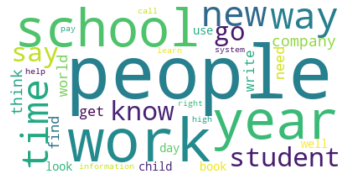

Topic  28


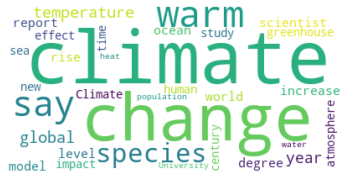

Topic  29


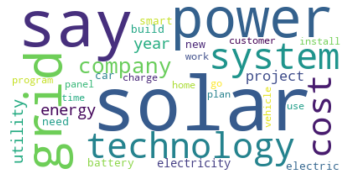

Topic  30


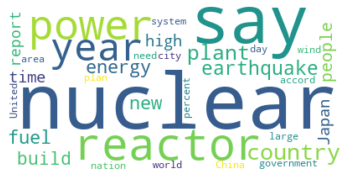

Topic  31


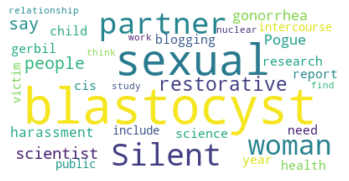

Topic  32


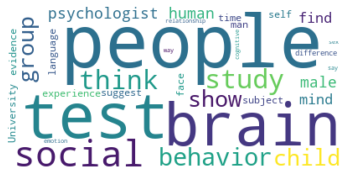

In [ ]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

#Generate topic word clouds
topic_number = 0 # Initialize counter
while topic_number < num_topics:
    topic_words_freq = dict(ldamodel.show_topic(topic_number, topn=32))
    #print(topic_words_freq)
    topic_number += 1    
    print("Topic ", topic_number)
    # Generate Word Cloud for topic using frequencies
    wordcloud = WordCloud(background_color="white").generate_from_frequencies(topic_words_freq) 
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    plt.show()

In [ ]:
def get_document_topics_df(ldamodel, corpus):
  topic_probabilities = ldamodel.get_document_topics(corpus) 
  topic_dict = [dict(i) for i in topic_probabilities] 
  df = pd.DataFrame(topic_dict).fillna(0) 
  return df
  

In [ ]:
def get_top_five_documents_for_topic(document_topics_df, articles, topic_number, num_docs=5):
  top_five_doc_indexes = document_topics_df[topic_number].argsort(axis=1)[::-1][:num_docs]
  print('Topic ', topic_number)
  for doc_idx in top_five_doc_indexes:
    print(articles[doc_idx])
  print('----')

In [ ]:
document_topics_df = get_document_topics_df(ldamodel, bag_of_words_representation)
get_top_five_documents_for_topic(document_topics_df, corrected_data, 0, num_docs=5)

In [ ]:
document_json = pd.to_csv()

In [ ]:
import json

In [ ]:
with open("Document_Topics.json",'w') as file:
  json.dump(document_topics_df,file)

TypeError: ignored

In [ ]:
document_topics_df.to_csv("/content/drive/MyDrive/Topic Modelling with LDA/document_topics.csv")

In [ ]:
document_topics_df.shape

(13437, 32)

In [ ]:
document_topics_df[0].argsort()

0         6718
1         6218
2        10881
3         6216
4         6215
         ...  
13432     9116
13433     6847
13434     7436
13435     6273
13436     5287
Name: 0, Length: 13437, dtype: int64